In [1]:
from utils.plotter_utils import *

# globals
model_name = 'gpt-3.5-turbo-0613'
cpd_dataset_folder = 'datasets/cpd_debates'
cpd_raw_debates_folder = f'{cpd_dataset_folder}/cpd_debates_raw'
cpd_slices_folder = f'{cpd_dataset_folder}/cpd_debates_slices'
cpd_slices_texts_folder = f'{cpd_dataset_folder}/cpd_debates_slices_text'
cpd_measurements_folder = f'{cpd_dataset_folder}/cpd_debates_measurements'
plots_folder = 'plots'

report_latex_folder = 'report/sec/code_info/'

debates_d, slices_d, paragraphs_d = load_dataset()

In [2]:
# count all observables
speaker_measurements = load_speaker_measurements()
slice_measurements = load_slice_measurements()
slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)


# count the number of single_speaker_observables
SS_SSO = speaker_measurements['WS_SS_SSO_measurements']

num_SS_SSO_distinct_slices = len(SS_SSO)

num_SS_SSO_distinct_speakers = set()
for slice in SS_SSO:
    num_SS_SSO_distinct_speakers.update(SS_SSO[slice].keys())
num_SS_SSO_distinct_speakers = len(num_SS_SSO_distinct_speakers)

num_SS_SSO_distinct_observables = set()
for slice in SS_SSO:
    for speaker in SS_SSO[slice]:
        num_SS_SSO_distinct_observables.update(SS_SSO[slice][speaker].keys())
num_SS_SSO_distinct_observables = len(num_SS_SSO_distinct_observables)

num_SS_SSO_measurements = 0
for slice in SS_SSO:
    for speaker in SS_SSO[slice]:
        num_SS_SSO_measurements += len(SS_SSO[slice][speaker])

print(f'num_SS_SSO_distinct_slices: {num_SS_SSO_distinct_slices}')
print(f'num_SS_SSO_distinct_speakers: {num_SS_SSO_distinct_speakers}')
print(f'num_SS_SSO_distinct_observables: {num_SS_SSO_distinct_observables}')
print(f'num_SS_SSO_measurements: {num_SS_SSO_measurements}')
print()

# count the number of slice observables
num_SSLO_distinct_observables = set()
for slice in slice_measurements['SSLO_measurements']:
    num_SSLO_distinct_observables.update(slice_measurements['SSLO_measurements'][slice].keys())
num_SSLO_distinct_observables = len(num_SSLO_distinct_observables)

num_SSLO_measurements = 0
for slice in slice_measurements['SSLO_measurements']:
    num_SSLO_measurements += len(slice_measurements['SSLO_measurements'][slice])

print(f'num_SSLO_distinct_observables: {num_SSLO_distinct_observables}')
print(f'num_SSLO_measurements: {num_SSLO_measurements}')
print()

# now all with base observables
num_SBO_distinct_observables = set()
for slice in slice_speaker_base_observables:
    for speaker in slice_speaker_base_observables[slice]:
        num_SBO_distinct_observables.update(slice_speaker_base_observables[slice][speaker].keys())
num_SBO_distinct_observables = len(num_SBO_distinct_observables) - num_SSLO_distinct_observables # SSLO was already counted

num_SBO_measurements = 0
for slice in slice_speaker_base_observables:
    for speaker in slice_speaker_base_observables[slice]:
        num_SBO_measurements += num_SBO_distinct_observables

print(f'num_SBO_distinct_observables: {num_SBO_distinct_observables}')
print(f'num_SBO_measurements: {num_SBO_measurements}')

num_SS_SSO_distinct_slices: 150
num_SS_SSO_distinct_speakers: 122
num_SS_SSO_distinct_observables: 103
num_SS_SSO_measurements: 60770

num_SSLO_distinct_observables: 5
num_SSLO_measurements: 750

num_SBO_distinct_observables: 21
num_SBO_measurements: 12390


In [3]:
print_estimated_cost()

100%|██████████| 81621/81621 [02:25<00:00, 559.26it/s]

OpenAI API usage statistics:
	Total queries: 81,621
	Total tokens: 213,676,479
		Input tokens: 212,025,801
		Output tokens: 1,650,678
		Compared to whole English Wikipedia: 3.561%
	Total Word Count: 172,090,392
		Input words: 171,502,278
		Output words: 588,114
	Estimated speaking time (175 words per minute, which is fast): 16389.56 hours
	Total cost: 321.34 USD
		Input cost: 318.04 USD
		Output cost: 3.30 USD
	Estimated human cost (assuming 20 $/h): 327791.22 USD


In [4]:
print_dataset_statistics()

Dataset statistics:
	Debates: 47
	Slices: 419
	Paragraphs: 8836
	Tokens: 1,006,127
	Words: 810,849
	Sentences: 50,336
	Estimated speaking time (175 words per minute, which is fast): 77.22 hours


In [5]:
# create latex tables for report about all obesrvables

# all
save_observables_to_latex_list(slice_variables_groups, 'slice_observables_groups', 'Slice Observables', 'tab:slice_observables_groups')
save_observables_to_latex_list(speaker_predictor_variables_groups, 'speaker_predictor_observables_groups', 'Speaker Predictor Observable Ensembles', 'tab:speaker_predictor_observables_groups')
save_observables_to_latex_list(speaker_result_variables_groups, 'speaker_result_observables_groups', 'Speaker Result Observable Ensembles', 'tab:speaker_result_observables_groups')

# example
save_observables_to_latex_list({'topic': slice_variables_groups['topic']}, 'slice_observable_example_topic', 'Slice Observable Example', 'tab:slice_observable_example_topic')
save_observables_to_latex_list({'evasiveness': speaker_predictor_variables_groups['evasiveness']}, 'speaker_predictor_observable_ensemble_example_evasiveness', 'Speaker Predictor Observable Ensemble Example', 'tab:speaker_predictor_observable_ensemble_example_evasiveness')
save_observables_to_latex_list({'score': speaker_result_variables_groups['score']}, 'speaker_result_observable_ensemble_example_score', 'Speaker Result Observable Ensemble Example', 'tab:speaker_result_observable_ensemble_example_score')

# given
save_given_observables(slices_d, caption='Defined Observables Description', label='tab:defined_observables_description')
save_given_observables(slices_d, caption='Defined Observables Description Subset', label='tab:defined_observables_description_subset', subset=['debate_year', 'speaker', 'speaker_party', 'speaker_won_election'], file_name='defined_observables_description_subset')

FileNotFoundError: [Errno 2] No such file or directory: 'report/sec/code_info//slice_observables_groups.tex'

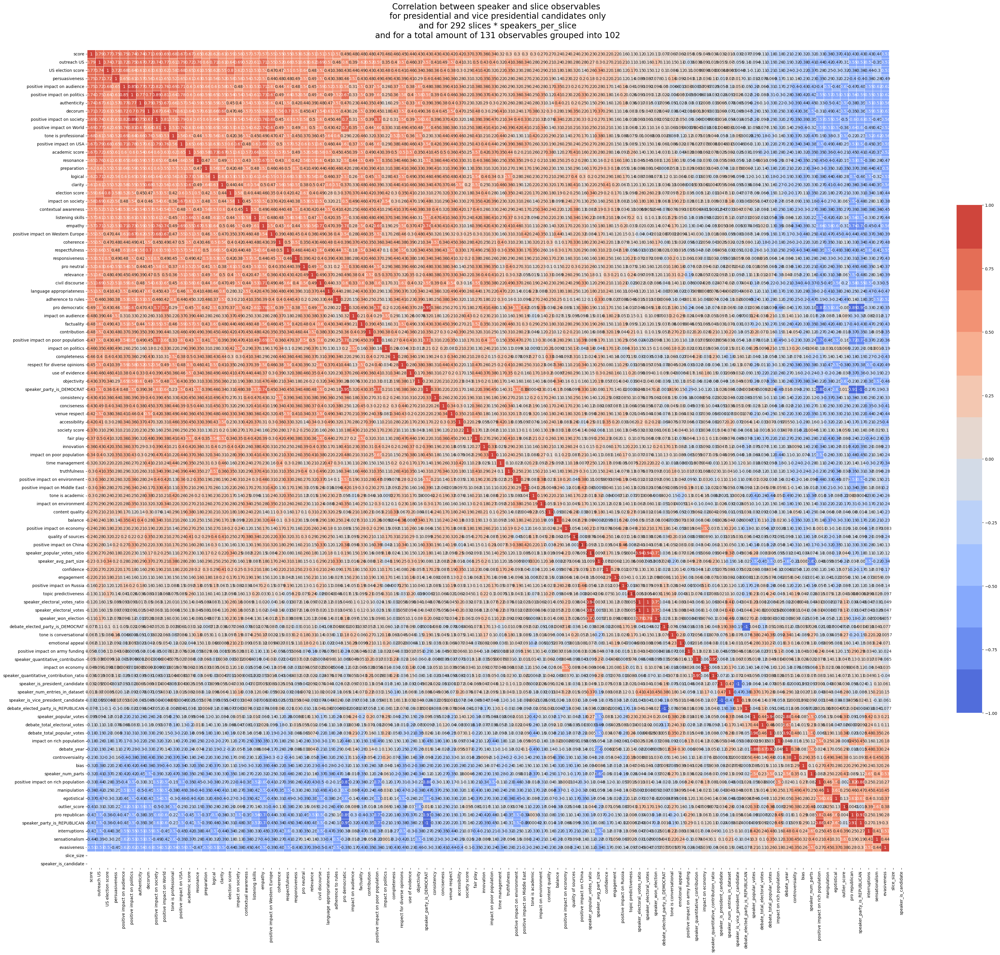

In [ ]:
slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

SS_SSO = speaker_measurements['WS_SS_SSO_measurements']

SS_SSO_grouped_df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, SS_SSO)

SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_df[SS_SSO_grouped_df['speaker_party_is_UNKNOWN'] == 0]
SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_candidates_only_df.drop(columns=['speaker_party_is_UNKNOWN'])

SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_candidates_only_df.select_dtypes(exclude=['object'])

# # invert all values that are negatively correlated with the score
# for col in SS_SSO_grouped_candidates_only_df.columns:
#     if col != 'score':
#         corr = SS_SSO_grouped_candidates_only_df['score'].corr(SS_SSO_grouped_candidates_only_df[col])
#         if corr < 0:
#             SS_SSO_grouped_candidates_only_df[col] = SS_SSO_grouped_candidates_only_df[col].apply(lambda x: -x)

# heatmap of correlations
corr = SS_SSO_grouped_candidates_only_df.corr()
corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)

# save_observables_to_latex_list('speaker_and_slice_observables', corr.columns)

# mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

SS_SSO_corr = corr
sns.heatmap(corr, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title(f'Correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

change
change
change
change


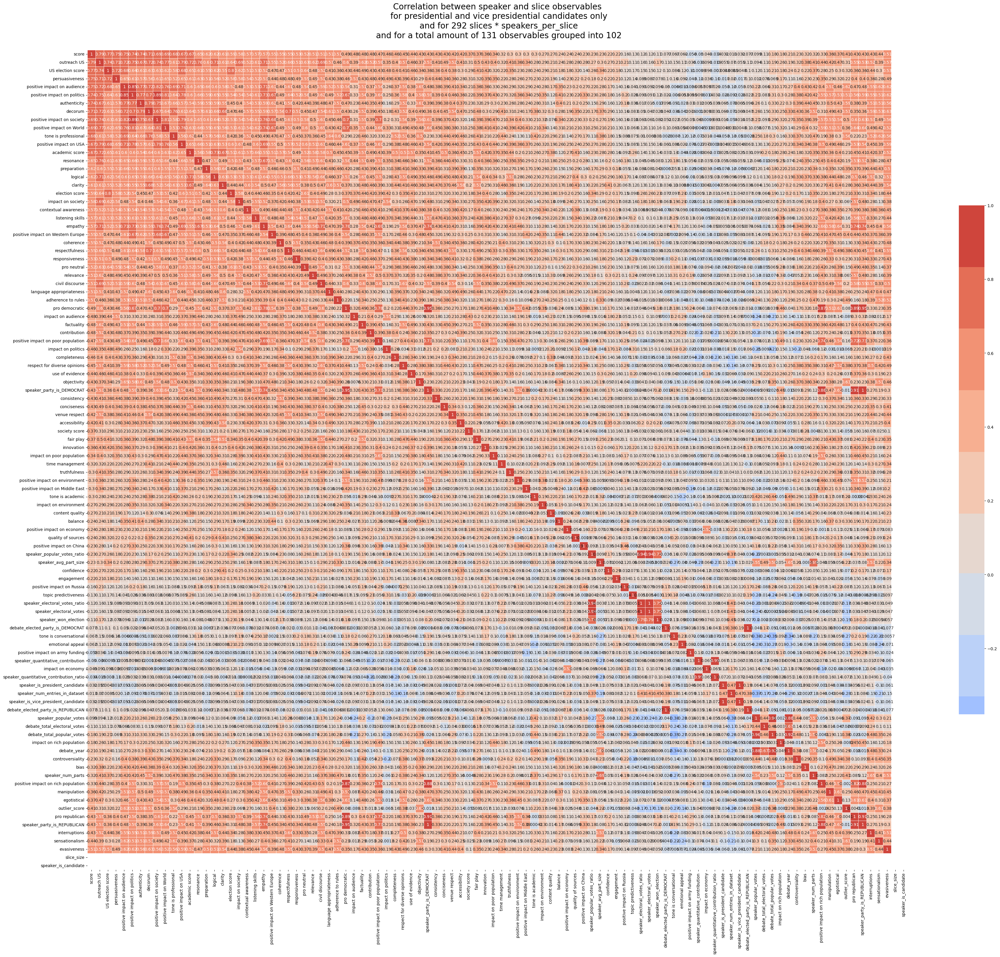

In [ ]:
slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

SS_SSO = speaker_measurements['WS_SS_SSO_measurements']

SS_SSO_grouped_df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, SS_SSO)

SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_df[SS_SSO_grouped_df['speaker_party_is_UNKNOWN'] == 0]
SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_candidates_only_df.drop(columns=['speaker_party_is_UNKNOWN'])

SS_SSO_grouped_candidates_only_df = SS_SSO_grouped_candidates_only_df.select_dtypes(exclude=['object'])

# heatmap of correlations
corr = SS_SSO_grouped_candidates_only_df.select_dtypes(exclude=['object']).corr()
corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)

# save_observables_to_latex_list('speaker_and_slice_observables', corr.columns)

# mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

SS_SSO_corr = corr.copy()

c_xy = corr

change = True
while change:
    print('change')
    change=False
    for col in c_xy.columns:
        if c_xy[col].sum()-c_xy[col][col] < 1e-7:
            c_xy[col] = -c_xy[col]
            c_xy.loc[col] = -c_xy.loc[col]
            change=True
corr = c_xy

sns.heatmap(corr, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title(f'Correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

In [ ]:
print(SS_SSO_grouped_candidates_only_df.columns)

Index(['debate_total_electoral_votes', 'debate_total_popular_votes',
       'slice_size', 'debate_year', 'speaker_quantitative_contribution',
       'speaker_quantitative_contribution_ratio', 'speaker_num_parts',
       'speaker_avg_part_size', 'speaker_electoral_votes',
       'speaker_electoral_votes_ratio', 'speaker_popular_votes',
       'speaker_popular_votes_ratio', 'speaker_won_election',
       'speaker_is_president_candidate', 'speaker_is_vice_president_candidate',
       'speaker_is_candidate', 'speaker_num_entries_in_dataset',
       'outlier_score', 'egotistical', 'persuasiveness', 'clarity',
       'contribution', 'truthfulness', 'bias', 'manipulation', 'evasiveness',
       'relevance', 'conciseness', 'use of evidence', 'emotional appeal',
       'objectivity', 'sensationalism', 'controversiality', 'coherence',
       'consistency', 'factuality', 'completeness', 'quality of sources',
       'balance', 'tone is professional', 'tone is conversational',
       'tone is acade

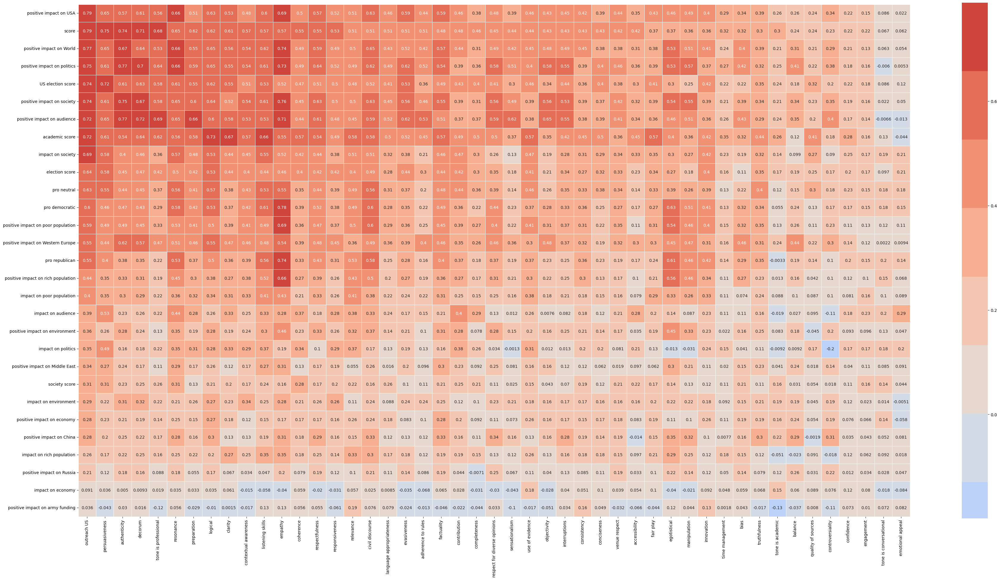

In [ ]:
# heatmap of correlations
corr_result_pred = corr.copy()
# make rows only contain observables in result_observables
corr_result_pred = corr_result_pred.loc[corr_result_pred.index.isin(set([o.name for o in result_variables.values()]))] 
# make columns only contain observables in predictor_observables
corr_result_pred = corr_result_pred[corr_result_pred.columns.intersection(set([o.name for o in predictor_variables.values()]))]

corr_result_pred = corr_result_pred.sort_values(by=['score'], axis=1, ascending=False)
# sort by values in first column
corr_result_pred = corr_result_pred.sort_values(by=[corr_result_pred.columns[0]], ascending=False)

f, ax = plt.subplots(figsize=(45, 45))
cmap = sns.color_palette("coolwarm", 12)

sns.heatmap(corr_result_pred, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

# plt.title(f'Correlation between speaker and slice observables\n \
# for presidential and vice presidential candidates only\n \
# and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
# and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

In [ ]:
# sort vars by absolute corr with debate year
corr = SS_SSO_grouped_candidates_only_df.corr()
cols = corr.loc['debate_year'].abs().sort_values(ascending=False).index
print(cols)

Index(['debate_year', 'debate_total_popular_votes', 'speaker_popular_votes',
       'debate_total_electoral_votes', 'speaker_avg_part_size',
       'speaker_num_parts', 'tone is academic', 'interruptions',
       'controversiality', 'tone is conversational', 'sensationalism',
       'decorum', 'tone is professional', 'emotional appeal', 'authenticity',
       'speaker_num_entries_in_dataset', 'respectfulness', 'outlier_score',
       'adherence to rules', 'positive impact on politics',
       'positive impact on society', 'positive impact on audience',
       'fair play', 'use of evidence', 'objectivity', 'coherence',
       'factuality', 'respect for diverse opinions', 'US election score',
       'evasiveness', 'academic score', 'positive impact on USA',
       'venue respect', 'preparation', 'score', 'civil discourse',
       'election score', 'clarity', 'outreach US', 'logical',
       'language appropriateness', 'contextual awareness',
       'impact on environment', 'positive impa

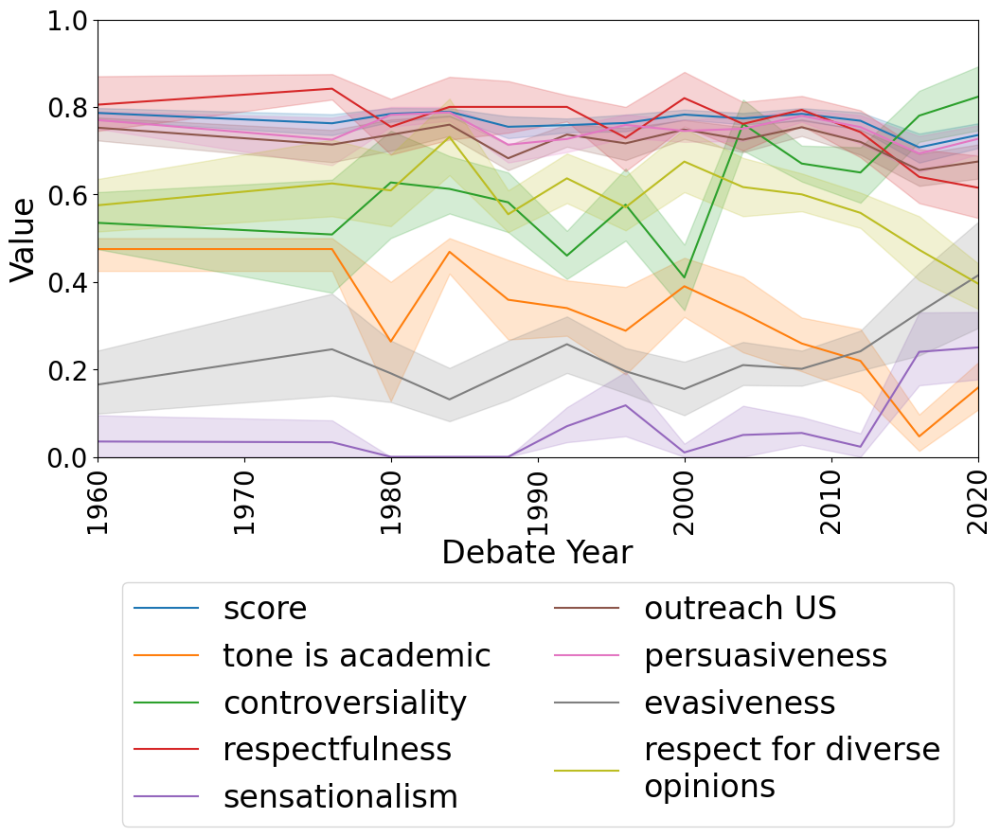

In [ ]:
# plot score, sensationalism, truthfullness against debate_year

targets = ['score', 'tone is academic', 'controversiality', 'respectfulness', 'sensationalism', 'outreach US', 'persuasiveness', 'evasiveness', 'respect for diverse opinions']
cols = ['debate_year']

fig = plt.figure(figsize=(12, 6))

# line plot
for target in targets:
    target_label = target
    if target == 'respect for diverse opinions':
        target_label = 'respect for diverse\nopinions'
    sns.lineplot(x=cols[0], y=target, data=SS_SSO_grouped_candidates_only_df, label=target_label)

big_font_size = 24
small_font_size = 20

# set min and max
plt.ylim(0, 1)
plt.xlim(1960, 2020)

# increase size of ticks
plt.xticks(fontsize=small_font_size)
plt.yticks(fontsize=small_font_size)

# increase size of labels
plt.xlabel('Debate Year', fontsize=big_font_size)
plt.ylabel('Value', fontsize=big_font_size)

# rotate x ticks
plt.xticks(rotation=90)

# # increase size of legend
# plt.legend(fontsize=12)

# # legend is in way, move it outside of plot
# plt.legend(loc='upper left', bbox_to_anchor=(1.01, 1), fontsize=big_font_size)
# make the legend below the plot
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), ncol=2, fontsize=big_font_size)

(array([0.5, 1.5]),
 [Text(0, 0.5, 'speaker_party\nis_REPUBLICAN'), Text(0, 1.5, 'score')])

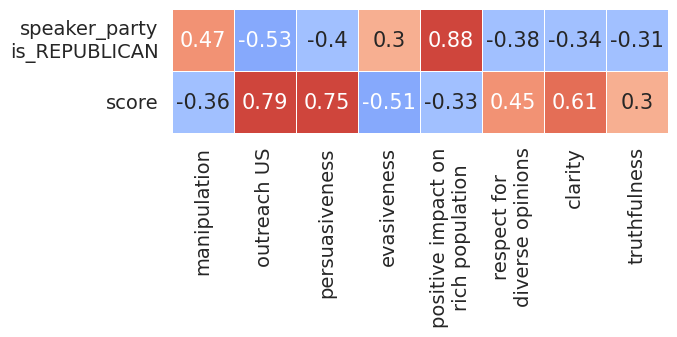

In [ ]:
import math

targets=['speaker_party_is_REPUBLICAN', 'score']
cols = ['manipulation', 'outreach US', 'persuasiveness', 'evasiveness', 'positive impact on rich population', 'respect for diverse opinions', 'clarity', 'truthfulness']

# # replace some names with shorter names
# target_replacements = {
#     'speaker_party_is_REPUBLICAN': 'speaker_party_is\nREPUBLICAN',
#     'positive impact on rich population': 'positive impact on\nrich population',
#     'respect for diverse opinions': 'respect for diverse\nopinions',
# }

corr = SS_SSO_corr.copy()

corr = SS_SSO_grouped_candidates_only_df.corr()
corr = corr.sort_values(by=targets, ascending=False)
corr = corr.sort_values(by=targets, axis=1, ascending=False)

corr = corr[targets]
corr = corr.loc[cols]

# # rename columns
# corr = corr.rename(columns=target_replacements, index=target_replacements)

# split all long names into multiple lines in the _ or space that is closest to the middle
for col in corr.columns:
    if len(col) > 20:
        # find the _ or space that is closest to the middle
        middle = len(col) / 2
        closest = 0
        for i, c in enumerate(col):
            if c == '_' or c == ' ':
                if abs(middle - i) < abs(middle - closest):
                    closest = i
        # split the string at the closest _ or space
        corr = corr.rename(columns={col: col[:closest] + '\n' + col[closest+1:]})

for col in corr.index:
    if len(col) > 20:
        # find the _ or space that is closest to the middle
        middle = len(col) / 2
        closest = 0
        for i, c in enumerate(col):
            if c == '_' or c == ' ':
                if abs(middle - i) < abs(middle - closest):
                    closest = i
        # split the string at the closest _ or space
        corr = corr.rename(index={col: col[:closest] + '\n' + col[closest+1:]})

# fig = plt.figure(figsize=(20, 10))

cmap = sns.color_palette("coolwarm", 12)


# increase size of labels in heatmap cells
sns.set(font_scale=1.25)
sns.heatmap(corr.T, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

# remove color bar
ax = plt.gca()
ax.collections[0].colorbar.remove()

# increase size of ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)



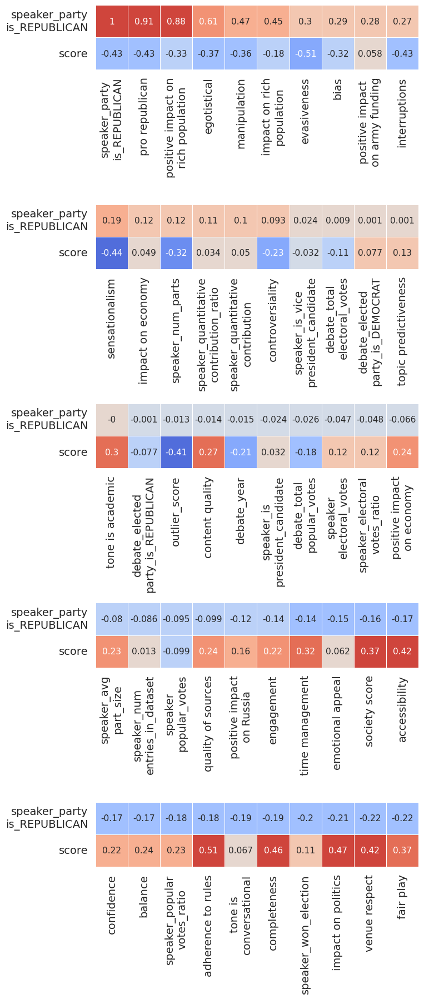

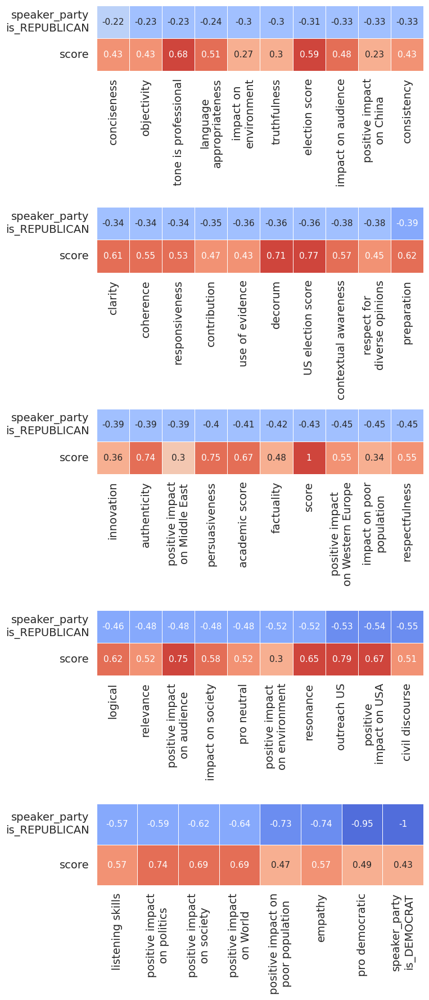

In [ ]:
import math

targets=['speaker_party_is_REPUBLICAN', 'score']

# # replace some names with shorter names
# target_replacements = {
#     'speaker_party_is_REPUBLICAN': 'speaker_party_is\nREPUBLICAN',
#     'positive impact on rich population': 'positive impact on\nrich population',
#     'respect for diverse opinions': 'respect for diverse\nopinions',
# }

corr = SS_SSO_corr
num_vars_per_subplot = 10
num_subplots = math.ceil(len(corr.columns) / num_vars_per_subplot)

# remove slize_size and speaker_is_candidate
df = SS_SSO_grouped_candidates_only_df.copy()
df = df.drop(columns=['slice_size', 'speaker_is_candidate'])

corr = df.corr()
corr = corr.sort_values(by=targets, ascending=False)
corr = corr.sort_values(by=targets, axis=1, ascending=False)

corr = corr[targets]

# split all long names into multiple lines in the _ or space that is closest to the middle
for col in corr.columns:
    if len(col) > 20:
        # find the _ or space that is closest to the middle
        middle = len(col) / 2
        closest = 0
        for i, c in enumerate(col):
            if c == '_' or c == ' ':
                if abs(middle - i) < abs(middle - closest):
                    closest = i
        # split the string at the closest _ or space
        corr = corr.rename(columns={col: col[:closest] + '\n' + col[closest+1:]})

for col in corr.index:
    if len(col) > 20:
        # find the _ or space that is closest to the middle
        middle = len(col) / 2
        closest = 0
        for i, c in enumerate(col):
            if c == '_' or c == ' ':
                if abs(middle - i) < abs(middle - closest):
                    closest = i
        # split the string at the closest _ or space
        corr = corr.rename(index={col: col[:closest] + '\n' + col[closest+1:]})

# corr = corr.rename(columns=target_replacements)

# round all values to 2 decimal places
corr = corr.round(3)

# plot speaker_party_is_DEMOCRT vs. first num_vars_per_subplot observables in first row as heatmap
for i in range(num_subplots):
    if i==0 or i==num_subplots//2:
        r = num_subplots//2 if i==0 else num_subplots - num_subplots//2
        fig, axs = plt.subplots(r, 1, figsize=(7.5, 4.5*r))
        cmap = sns.color_palette("coolwarm", 12)
    
    c = i - num_subplots//2 if i >= num_subplots//2 else i

    data = corr.iloc[i*num_vars_per_subplot:(i+1)*num_vars_per_subplot]

    plt.subplot(num_subplots//2, 1, c+1)

    # sns.set(font_scale=1.25)
    sns.heatmap(data.T, cmap=cmap, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
    
    # remove color bar
    ax = plt.gca()
    ax.collections[0].colorbar.remove()

    # increase size of ticks
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    # set rotation of x ticks
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)

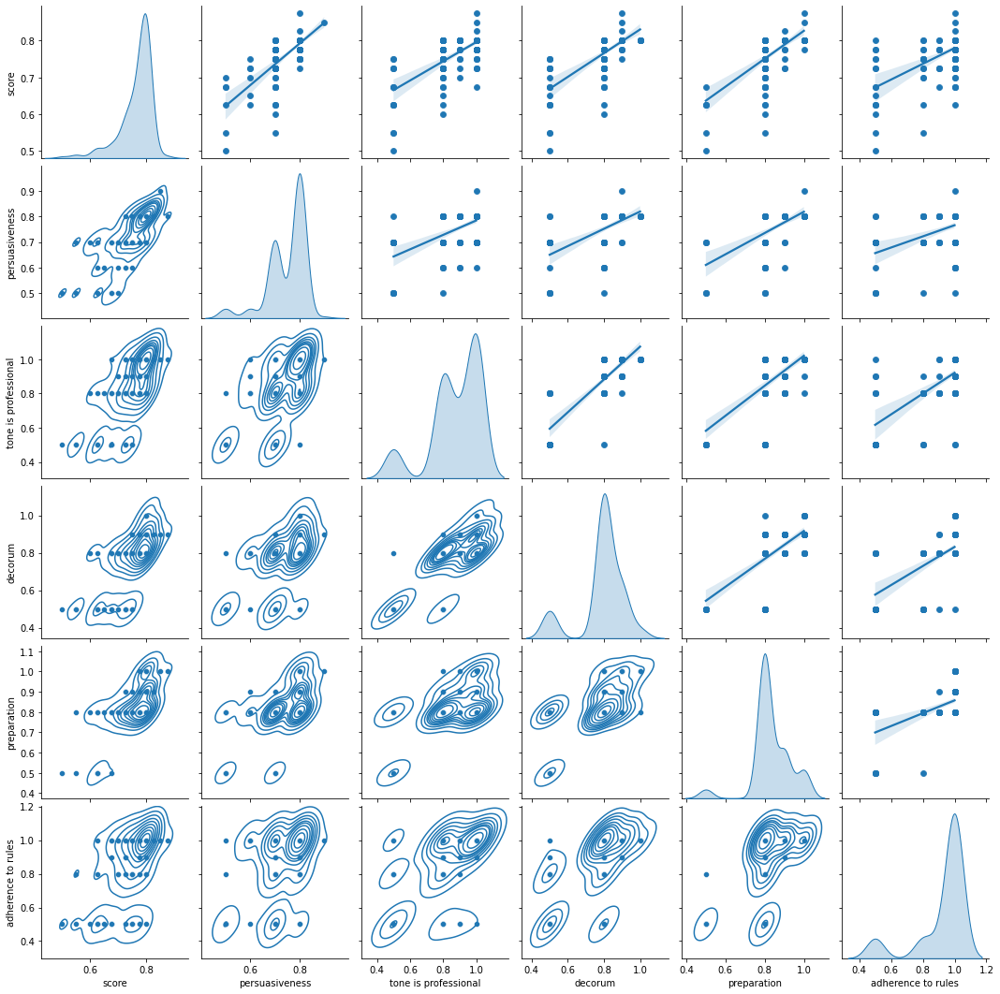

In [ ]:
# pairplot of top 5 correlations vs all result
top_5_corr = ['score']
for i in range(5):
    top_5_corr.append(corr_result_pred.columns[i])

g = sns.pairplot(SS_SSO_grouped_candidates_only_df, vars=top_5_corr, diag_kind='kde')
# g.map_upper(sns.scatterplot)
g.map_upper(sns.regplot)
g.map_lower(sns.kdeplot)
# g.map_diag(sns.kdeplot, lw=3, legend=False)

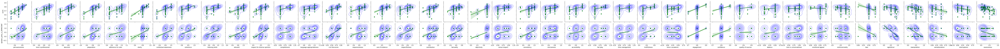

In [ ]:
# pairplot of top 5 correlations vs all result
top_5_corr = corr_result_pred.columns
rows = ['score', 'speaker_party_is_DEMOCRAT']

g = sns.pairplot(SS_SSO_grouped_candidates_only_df, x_vars=top_5_corr, y_vars=rows, diag_kind='kde')
# g.map_upper(sns.scatterplot)
# g.map_upper(sns.regplot)
# g.map_lower(sns.kdeplot)
g.map(sns.regplot, color='green')
g.map(sns.kdeplot, color='blue', alpha=0.5)
# g.map_diag(sns.kdeplot, lw=3, legend=False)

In [ ]:
df = SS_SSO_grouped_candidates_only_df.copy()

corr = df.corr()
corr.dropna(axis=0, how='all', inplace=True)
corr.dropna(axis=1, how='all', inplace=True)

# compute variance inflation factor
# https://www.statsmodels.org/stable/generated/statsmodels.stats.outliers_influence.variance_inflation_factor.html
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Add a constant "intercept" column to your dataframe because the statsmodels' VIF method expects it
# df['Intercept'] = 1

# # The independent variables set
# X = df[['Intercept', 'Feature1', 'Feature2', 'Feature3', ...]]  # include more features if required
X = df[corr.columns]
X['Intercept'] = 1

print(corr.columns)
print(df['speaker_won_election'].unique())

# Compute and view VIF
vif = pd.DataFrame()
vif["variables"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# print(vif)
for row in vif.iterrows():
    print(row[1]['variables'], row[1]['VIF'])

# # estimate uniquness of an observable by normalizing sum of correlations with other observables
# df = SS_SSO_grouped_candidates_only_df.copy()
# corr = df.corr()
# corr.dropna(axis=0, how='all', inplace=True)
# corr.dropna(axis=1, how='all', inplace=True)

# corr = 1-corr.abs()

# # # normalize corr matrix rows
# # for row in corr.index:
# #     corr.loc[row] = corr.loc[row].abs()/corr.loc[row].abs().sum()

# vals = {}
# for col in corr.columns:
#     vals[col] = corr[col].sum()
# sum1 = sum(vals.values())
# for key in vals.keys():
#     vals[key] = vals[key]/sum1

# df2 = SS_SSO_grouped_candidates_only_df.copy()
# # add column that is equivalent to truthfulness
# for i in range(10):
#     df2[f'truthfulness_{i}'] = df2['truthfulness']
# # df2['truthfulness_2'] = df2['truthfulness']
# corr2 = df2.corr()
# corr2.dropna(axis=0, how='all', inplace=True)
# corr2.dropna(axis=1, how='all', inplace=True)
# corr2 = 1-corr2.abs()
# # for row in corr2.index:
# #     corr2.loc[row] = corr2.loc[row].abs()/corr2.loc[row].abs().sum()

# vals2 = {}
# for col in corr2.columns:
#     vals2[col] = corr2[col].sum()
# # normalize
# sum2 = sum(vals2.values())
# for key in vals2.keys():
#     vals2[key] = vals2[key]/sum2

# for key, val in sorted(vals2.items(), key=lambda item: item[1], reverse=True):
#     print(f'{key:<40}: {val:.4f} {vals.get(key, 0.0):.4f}')

# # normalize columns of dfs
# for col in vals.keys():
#     df[col] = (df[col] - df[col].mean())/df[col].std()
# for col in vals2.keys():
#     df2[col] = (df2[col] - df2[col].mean())/df2[col].std()

# for index, entry in df2.iterrows():
#     # get weighted sums
#     sum_1 = 0
#     sum_2 = 0
#     for key in vals2.keys():
#         sum_1 += entry[key]*vals2[key]
#         sum_2 += entry[key]*vals.get(key, 0)
#     print(sum_1, sum_2)

    
# # corr = corr.sort_values(by=['score'], ascending=False)
# # corr = corr.sort_values(by=['score'], axis=1, ascending=False)
# # # mask = np.triu(np.ones_like(corr, dtype=bool))
# # f, ax = plt.subplots(figsize=(45, 45))
# # # create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# # # create color map where the gradient changes faster if there are more values in a bin
# # cmap = sns.color_palette("coolwarm", 12)

# # SS_SSO_corr = corr
# # sns.heatmap(corr, cmap=cmap, center=0,
# #             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)


# # uniqueness = {}
# # obs_sum = {}
# # for observable in corr.columns:
# #     corr_sum = corr[observable].abs().sum()
# #     obs_sum[observable] = corr_sum
# # for observable in corr.columns:
# #     for observable2 in corr.columns:
# #         if observable != observable2:
# #             uniqueness[observable] = abs(corr[observable][observable2])/obs_sum[observable2]
# # # tot_sum = sum(uniqueness.values())
# # # for key, val in uniqueness.items():
# # #     uniqueness[key] = val / tot_sum

# # # # get svd of correlation matrix
# # # from numpy import linalg as LA
# # # U, s, Vh = LA.svd(corr, full_matrices=False)
# # # # get first column of U
# # # for i, (key, val) in enumerate(uniqueness.items()):
# # #     uniqueness[key] = (uniqueness[key], U[i][0])

# # for key, val in sorted(uniqueness.items(), key=lambda item: item[1], reverse=True):
# #     print(f'{key:<40}: {val:.3f}')

Index(['debate_total_electoral_votes', 'debate_total_popular_votes',
       'debate_year', 'speaker_quantitative_contribution',
       'speaker_quantitative_contribution_ratio', 'speaker_num_parts',
       'speaker_avg_part_size', 'speaker_electoral_votes',
       'speaker_electoral_votes_ratio', 'speaker_popular_votes',
       'speaker_popular_votes_ratio', 'speaker_won_election',
       'speaker_is_president_candidate', 'speaker_is_vice_president_candidate',
       'speaker_num_entries_in_dataset', 'outlier_score', 'egotistical',
       'persuasiveness', 'clarity', 'contribution', 'truthfulness', 'bias',
       'manipulation', 'evasiveness', 'relevant', 'conciseness',
       'use of evidence', 'emotional appeal', 'objectivity', 'sensationalism',
       'controversiality', 'coherence', 'consistency', 'factuality',
       'completeness', 'quality of sources', 'balance', 'tone is professional',
       'tone is conversational', 'tone is academic', 'accessibility',
       'engagement', 'a

/tmp/ipykernel_227465/3816559303.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Intercept'] = 1
/home/david/anaconda3/lib/python3.9/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)
/home/david/anaconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


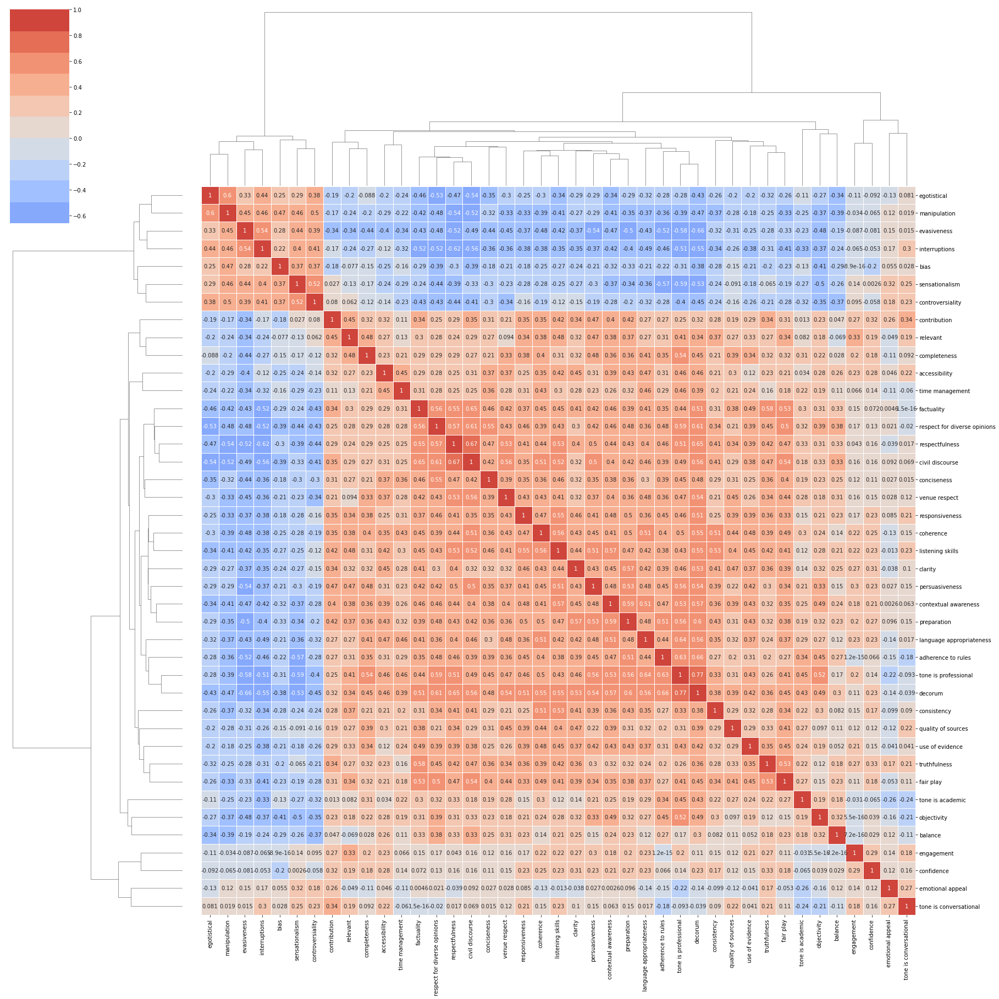

In [ ]:
# plot correlations between predictor observables to identify which form a cluster
corr_sub = corr.copy()
corr_sub = corr_sub.loc[corr_sub.index.isin(set([o.name for o in predictor_variables.values()]))]
corr_sub = corr_sub[corr_sub.columns.intersection(set([o.name for o in predictor_variables.values()]))]

# f, ax = plt.subplots(figsize=(45, 45))
cmap = sns.color_palette("coolwarm", 12)

# sns.heatmap(corr_sub, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

# drop na
corr_sub = corr_sub.dropna(axis=0, how='all')
corr_sub = corr_sub.dropna(axis=1, how='all')

# print(corr_sub)

g = sns.clustermap(corr_sub, xticklabels=True, yticklabels=True, cmap=cmap, center=0, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
g.fig.set_size_inches(30, 30)

# sns.heatmap(corr_sub, cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

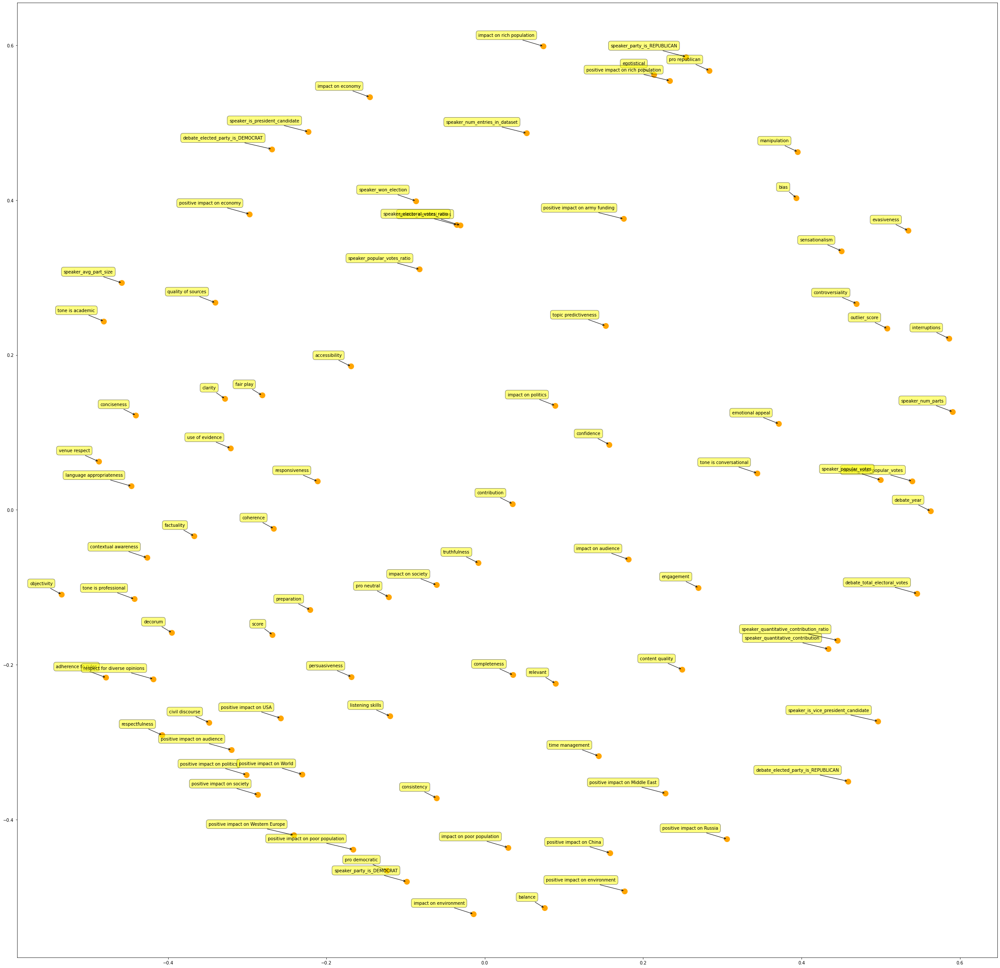

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS

# corr_graph = corr_sub.copy()
corr_graph = SS_SSO_grouped_candidates_only_df.copy().corr()

# remove rows and columns that are all na
corr_graph = corr_graph.dropna(axis=0, how='all')
corr_graph = corr_graph.dropna(axis=1, how='all')

dist_matrix = np.sqrt((1 - corr_graph) / 2)

mds = MDS(n_components=2, dissimilarity='precomputed', random_state=1)
coords = mds.fit_transform(dist_matrix)

plt.figure(figsize=(40, 40))
plt.scatter(coords[:, 0], coords[:, 1], color='orange', s=150)

for label, x, y in zip(dist_matrix.columns, coords[:, 0], coords[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(-20, 20), textcoords='offset points', ha='right', va='bottom',
                 bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
                 arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

plt.show()

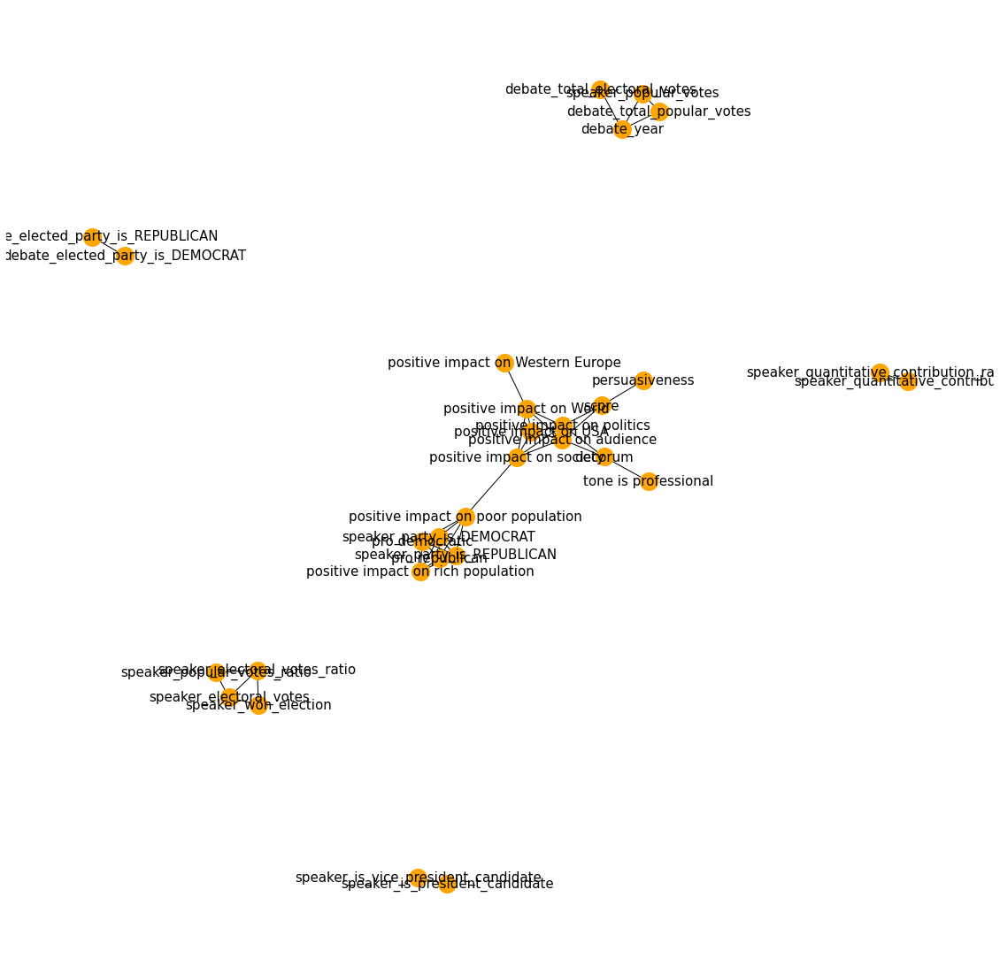

In [ ]:
# libraries
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

df = SS_SSO_grouped_candidates_only_df.copy()

# Calculate the correlation between individuals. We have to transpose first, because the corr function calculate the pairwise correlations between columns.
corr = df.corr()

# Transform it in a links data frame (3 columns only):
links = corr.stack().reset_index()
links.columns = ['var1', 'var2', 'value']

# # Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
links_filtered=links.loc[ (abs(links['value']) > 0.7) & (links['var1'] != links['var2']) ]

# Build your graph
G=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2')

# Plot the network:
f, ax = plt.subplots(figsize=(20, 20))
nx.draw(G, ax=ax, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=15)

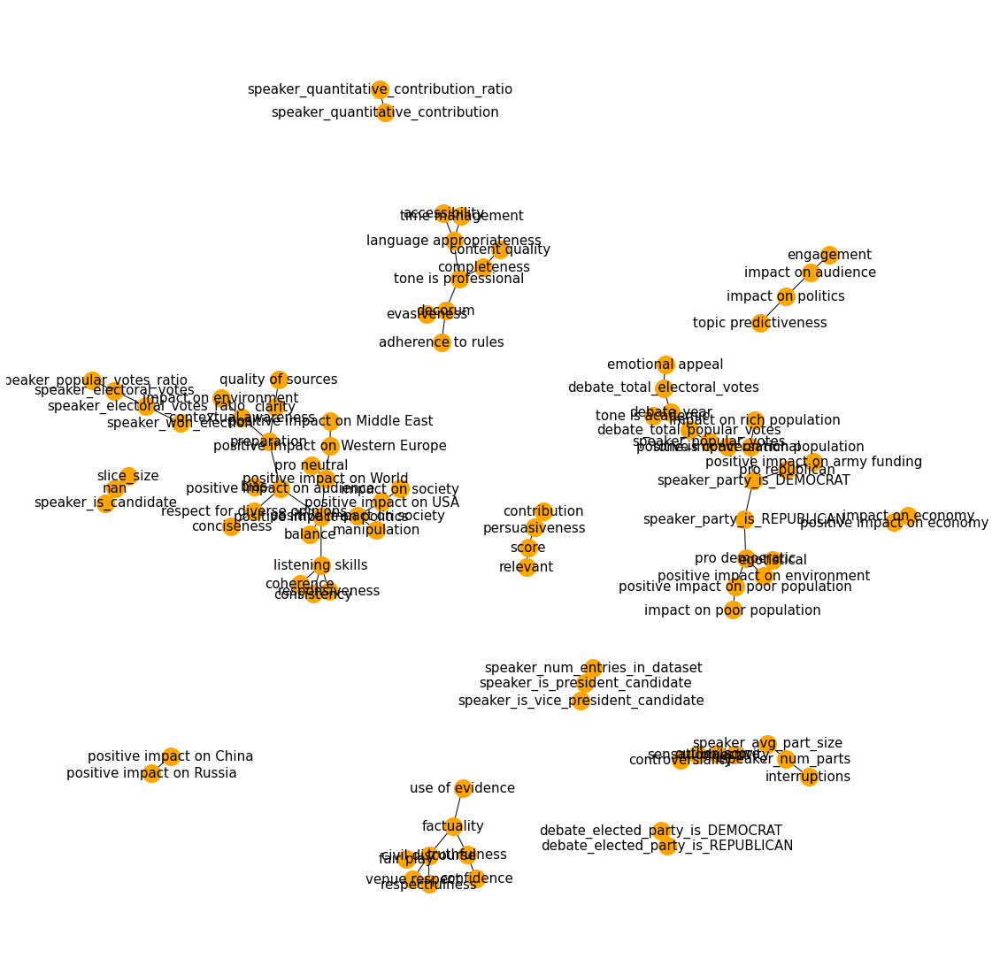

In [ ]:
# libraries
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

df = SS_SSO_grouped_candidates_only_df.copy()
df.dropna(axis=0, how='all', inplace=True)
df.dropna(axis=1, how='all', inplace=True)

# Calculate the correlation between individuals. We have to transpose first, because the corr function calculate the pairwise correlations between columns.
corr = df.corr()

# for each row get column with max abs value
max_abs_corr_dict = {}
for key, data in corr.iterrows():
    max_abs_corr_dict[key] = data[data.index != key].abs().idxmax()

# # Build your graph
G = nx.Graph()
for key, value in max_abs_corr_dict.items():
    G.add_edge(key, value)

# # Plot the network:
f, ax = plt.subplots(figsize=(20, 20))
nx.draw(G, ax=ax, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=15)

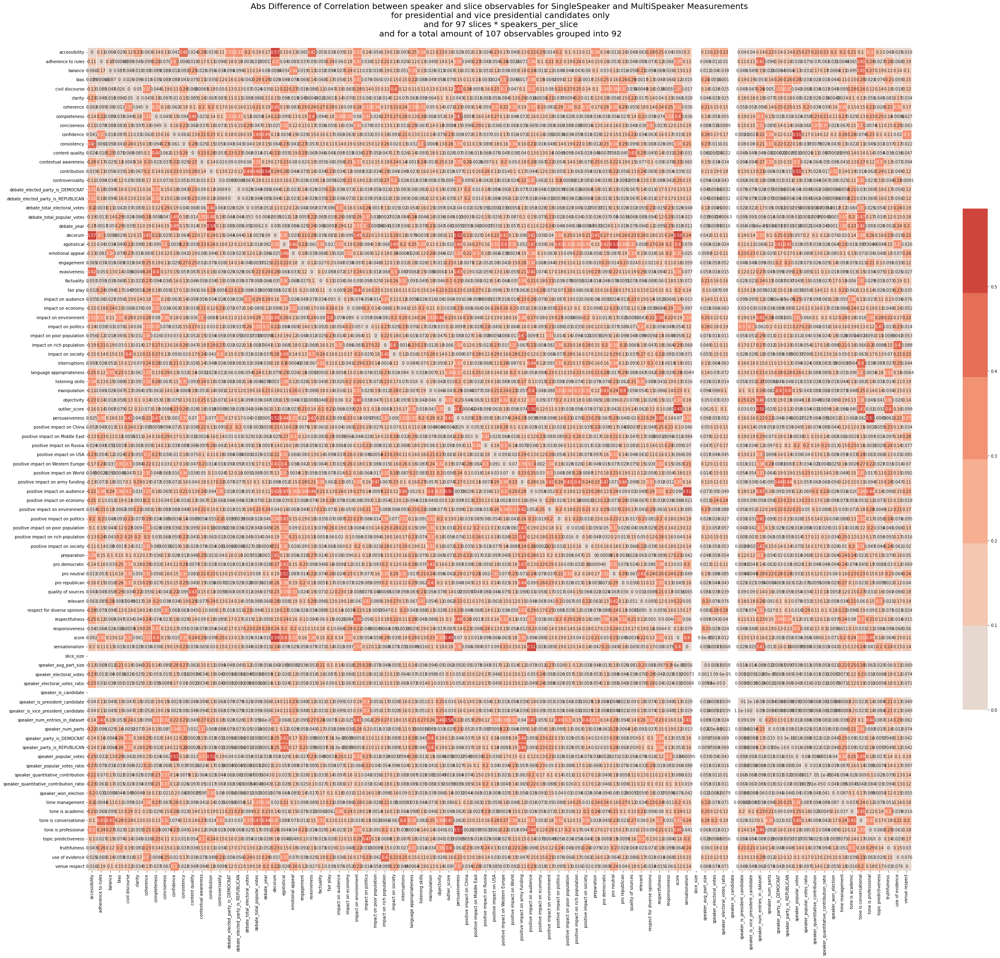

In [ ]:
debates_d, slices_d, paragraphs_d = load_dataset()

slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

MS_SSO = speaker_measurements['WS_MS_SSO_measurements']

MS_SSO_grouped_df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, MS_SSO)

MS_SSO_grouped_candidates_only_df = MS_SSO_grouped_df[MS_SSO_grouped_df['speaker_party_is_UNKNOWN'] == 0]
MS_SSO_grouped_candidates_only_df = MS_SSO_grouped_candidates_only_df.drop(columns=['speaker_party_is_UNKNOWN'])

# heatmap of correlations
corr = MS_SSO_grouped_candidates_only_df.corr()
corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)
# mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

MS_SSO_corr = corr
# abs of difference between SS_SSO_corr and MS_SSO_corr
data = np.abs(SS_SSO_corr-MS_SSO_corr)
sns.heatmap(data, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title(f'Abs Difference of Correlation between speaker and slice observables for SingleSpeaker and MultiSpeaker Measurements\n \
for presidential and vice presidential candidates only\n \
and for {len(MS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

['BROKAW', 'DANFORTH QUAYLE', 'LLOYD BENTSEN', 'WOODRUFF']


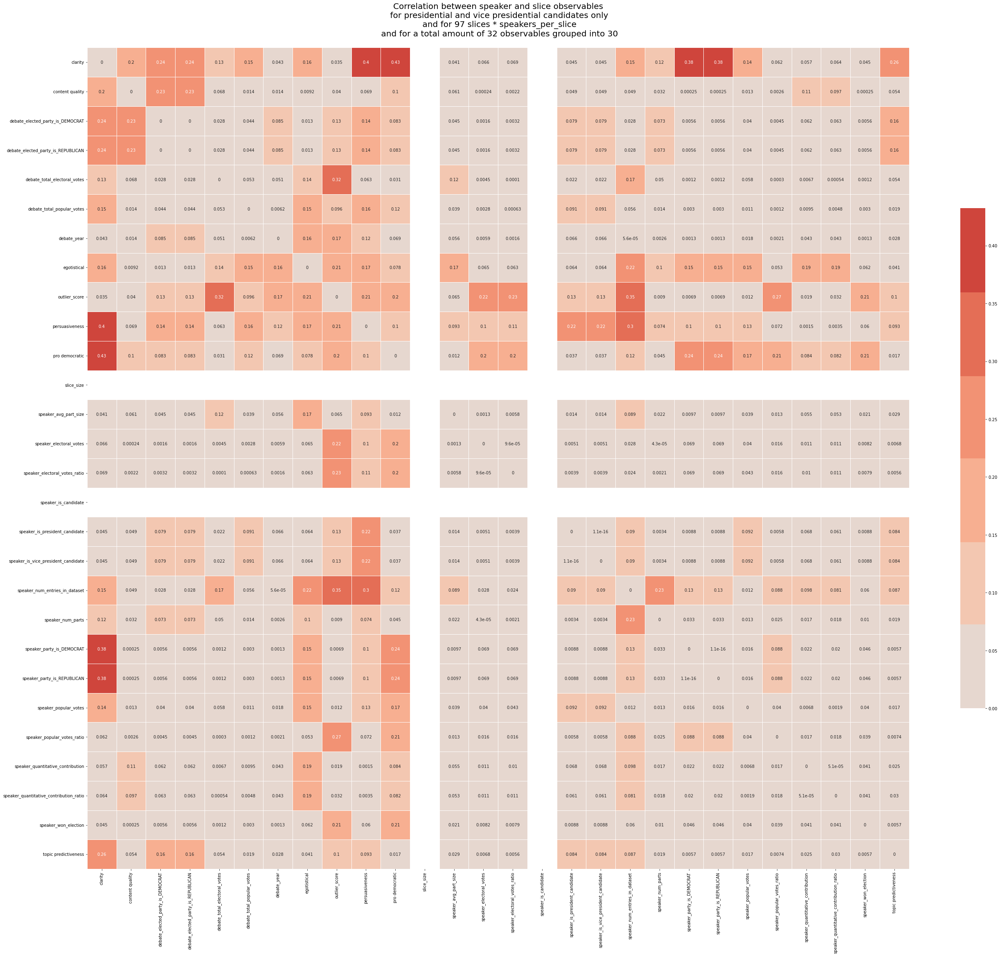

In [ ]:
debates_d, slices_d, paragraphs_d = load_dataset()

slice_speaker_base_observables = load_slice_and_measured_observables(slices_d)
speaker_measurements = load_speaker_measurements()

df = speaker_measurements['WS_SS_MSO_group 1_measurements']
measured_observables = list(list(list(speaker_measurements.values())[0].values())[0].keys())
print(measured_observables)

df, n_raw_observables, n_grouped_observables = prepare_speaker_observables(slice_speaker_base_observables, df)

df = df[df['speaker_party_is_UNKNOWN'] == 0]
df = df.drop(columns=['speaker_party_is_UNKNOWN'])

# heatmap of correlations
corr = df.corr()
# corr = corr.sort_values(by=['score'], ascending=False)
# corr = corr.sort_values(by=['score'], axis=1, ascending=False)
# mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(45, 45))
# create color map between -1 and 1 for heatmap that is dark blue for -1, light blue for -0.5, white for 0, light red for 0.5, dark red for 1
# create color map where the gradient changes faster if there are more values in a bin
cmap = sns.color_palette("coolwarm", 12)

SS_MSO_corr = corr
# drop all in SS_SSO_corr that are not in SS_MSO_corr
SS_SSO_corr_dropped = SS_SSO_corr[SS_SSO_corr.index.isin(SS_MSO_corr.index)]
SS_SSO_corr_dropped = SS_SSO_corr_dropped[SS_SSO_corr_dropped.columns.intersection(SS_MSO_corr.columns)]
# abs of difference between SS_SSO_corr and MS_SSO_corr
data = np.abs(SS_SSO_corr_dropped-SS_MSO_corr)
sns.heatmap(data, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.title(f'Correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(MS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()

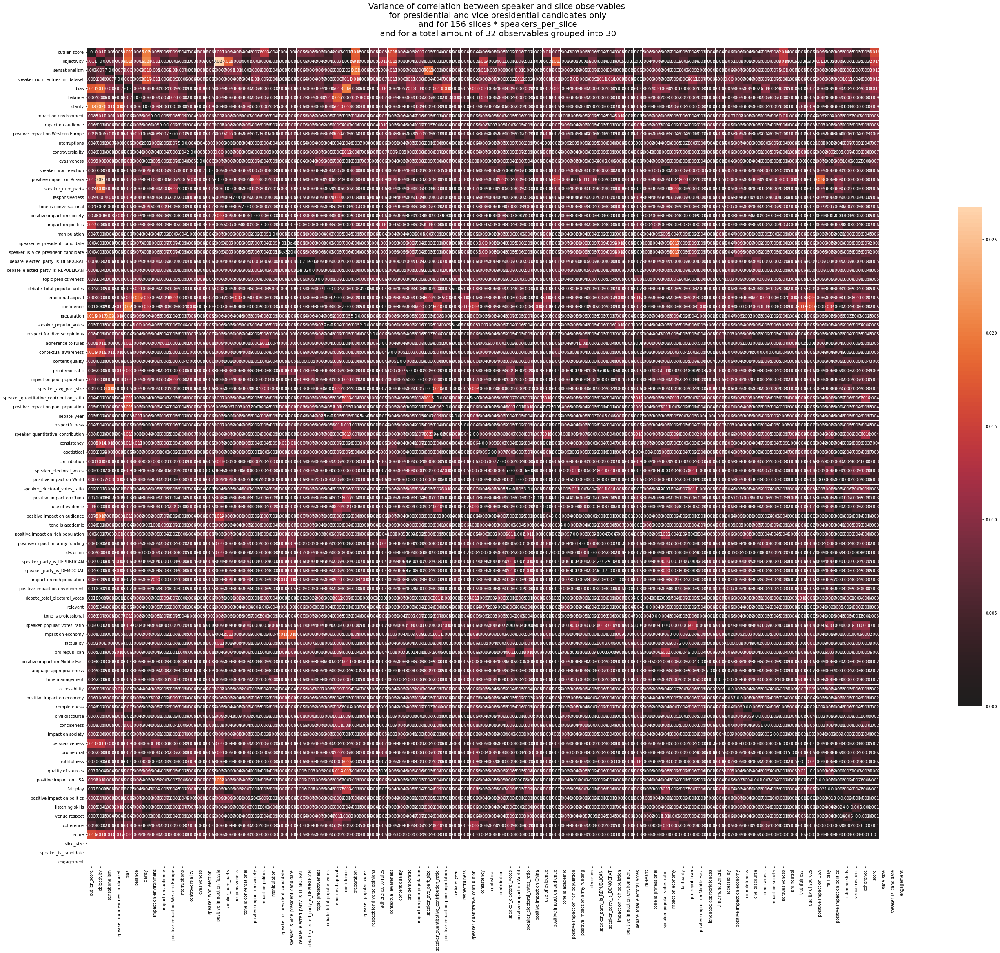

In [ ]:
def kfold_cross_validation(df, accumulation_func, combine_func, n_splits=2, iterations=50):
    _vals = []
    for i in range(iterations):
        kf = KFold(n_splits, shuffle=True, random_state=i)
        
        for train_index, _ in kf.split(df):
            train_data = df.iloc[train_index]
            _vals.append(accumulation_func(train_data))
    
    columns = _vals[0].columns
    rows = _vals[0].index

    vals = np.array(_vals)
    acc_vals = np.zeros_like(vals[0])
    for i, j in itertools.product(range(vals.shape[1]), range(vals.shape[2])):
        acc_vals[i, j] = combine_func(vals[:, i, j])

    acc_vals = pd.DataFrame(acc_vals, index=rows, columns=columns)

    return acc_vals

# kfold cross validation over correlation of subsets
df = SS_SSO_grouped_candidates_only_df

# _correlations = []
# for i in range(50):
#     kf = KFold(2, shuffle=True, random_state=i)
    
#     for train_index, _ in kf.split(df):
#         train_data = df.iloc[train_index]
#         corr = train_data.corr()
#         _correlations.append(corr)

# # get variance of correlations
# columns = _correlations[0].columns
# correlations = np.array(_correlations)

# corr = correlations.var(axis=0)
# corr = pd.DataFrame(corr, index=columns, columns=columns)

corr = kfold_cross_validation(df, lambda x: x.corr(), lambda x: x.var())

corr = corr.sort_values(by=['score'], ascending=False)
corr = corr.sort_values(by=['score'], axis=1, ascending=False)
f, ax = plt.subplots(figsize=(45, 45))
sns.heatmap(corr, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
plt.title(f'Variance of correlation between speaker and slice observables\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
# plt.show()
plt.savefig(f'{plots_folder}/variance_of_correlation_between_speaker_and_slice_observables.png', dpi=300)




# # # plot catplot of correlations of score vs other observables
# # entries = []
# # # sort entries of corr by variance
# # corr_entries_sorted = corr.stack().sort_values(ascending=False)
# # # make sure that the same correlation is not added twice
# # seen = set()
# # for key_one, key_two in corr_entries_sorted.index:
# #     if (key_one, key_two) in seen or (key_two, key_one) in seen:
# #         continue
# #     seen.add((key_one, key_two))
# #     if key_one == key_two:
# #         continue
# #     for i in range(len(_correlations)):
# #         entries.append({'observable': f'{key_one} vs. {key_two}', 'correlation': _correlations[i][key_one][key_two]})
# # df = pd.DataFrame(entries)

# df = pd.DataFrame(corr.stack(), columns=['correlation'])
# # combine multiindex into one column

# df = df[df.index.map(lambda x: x[0]<=x[1])]
# df['observable'] = df.index.map(lambda x: f'{x[0]} vs. {x[1]}')
# observables = df.groupby('observable')['correlation'].var().sort_values(ascending=False).index
# # plot in groups of 30
# for i in range(0, len(df.groupby('observable')), 30):
#     # get next 30 observables
#     data = df[df['observable'].isin(observables[i:i+30])]
#     g = sns.catplot(x="observable", y="correlation", kind="violin", data=data, height=10, aspect=2)
#     g.fig.set_size_inches(30, 10)
#     g.set_xticklabels(rotation=90)
#     # plt.show()
#     plt.savefig(f'{plots_folder}/correlation_variances_wide_violin_{i}.png', bbox_inches='tight', dpi=300)
#     if i!=0:
#         plt.close()

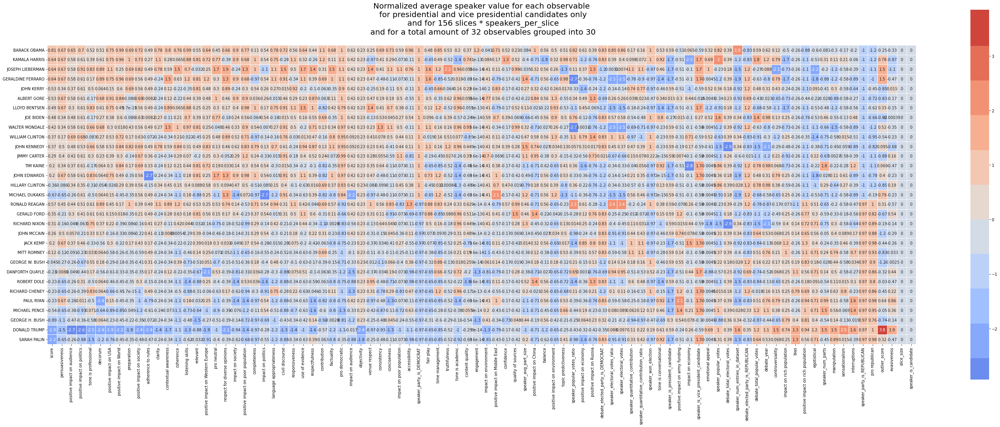

In [ ]:
# speaker vs average slice observables heatmap
df = SS_SSO_grouped_candidates_only_df.copy()

values = {}
for key in df.keys():
    if isinstance(df[key].iloc(0)[0], str):
        continue
    values[key] = {}
    for speaker in df['speaker'].unique():
        values[key][speaker] = df[df['speaker'] == speaker][key].mean()
        # normalize
        values[key][speaker] = values[key][speaker] - df[key].mean()
        key_std = df[key].std()
        if key_std != 0:
            values[key][speaker] = values[key][speaker] / key_std

# add a row with sum of abs called outlier_score
values['outlier_score'] = {}
for speaker in list(values.values())[0].keys():
    values['outlier_score'][speaker] = sum([values[key][speaker]**2 for key in values.keys() if key != 'outlier_score'])
# normalize outlier_score
outlier_score_mean = np.mean(list(values['outlier_score'].values()))
outlier_score_std = np.std(list(values['outlier_score'].values()))
for speaker in list(values.values())[0].keys():
    values['outlier_score'][speaker] = (values['outlier_score'][speaker] - outlier_score_mean) / outlier_score_std


speakers = df['speaker'].unique()
observables = list(values.keys())

# # sort speakers by their score in pro republican
# speakers = sorted(speakers, key=lambda speaker: values['pro republican'][speaker], reverse=True)
# speakers = sorted(speakers, key=lambda speaker: values['speaker_party_is_REPUBLICAN'][speaker], reverse=True)
speakers = sorted(speakers, key=lambda speaker: values['score'][speaker] - 10 * values['speaker_party_is_REPUBLICAN'][speaker], reverse=True)
# # sort observables by normalized dot product of their values with pro republican
# observables = sorted(observables, key=lambda observable: np.dot([values[observable][speaker] for speaker in speakers], [values['pro republican'][speaker] for speaker in speakers]), reverse=True)
# speakers = sorted(speakers, key=lambda speaker: values['score'][speaker], reverse=True)
# # sort by correlation with score, but with all 0 values at the end
# observables = sorted(observables, key=lambda observable: -4 + int(observable not in corr['score']) if sum(map(abs,values[observable].values())) <= 0.2 or observable not in corr['score'] else  corr['score'][observable] , reverse=True)
# observables = sorted(observables, key=lambda observable: -10 + int(observable not in corr['score']) if sum(map(abs,df[observable].std())) <= 1e-8 or observable not in corr['score'] else  corr['score'][observable] , reverse=True)

# or if NAN
corr = df.corr()
observables = sorted(observables, key=lambda observable: (-10 + int(observable not in corr['score'])) if df[observable].std() <= 1e-8 or observable not in corr['score'] or corr['score'][observable]!=corr['score'][observable] else  corr['score'][observable] , reverse=True)
# observables = sorted(observables, key=lambda observable: corr['score'][observable] if observable in corr['score'].keys() and corr['score'][observable]==corr['score'][observable] else -10, reverse=True)
speaker_observable_value_matrix = []
for speaker in speakers:
    speaker_observable_value_matrix.append([values[observable][speaker] for observable in observables])

f, ax = plt.subplots(figsize=(50, 35))
cmap = sns.color_palette("coolwarm", 12)
sns.heatmap(speaker_observable_value_matrix, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# set xticks to speaker names
ax.set_yticklabels(speakers, rotation=0)
ax.set_xticklabels(observables, rotation=90)
plt.title(f'Normalized average speaker value for each observable\n \
for presidential and vice presidential candidates only\n \
and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
plt.show()




# # values = {k: v for k, v in sorted(values.items(), key=lambda item: sum(map(abs, item[1].values())), reverse=True)}
# values_df_entries = []
# for key, value in values.items():
#     for speaker, v in value.items():
#         values_df_entries.append({'speaker': speaker, 'observable': key, 'value': v})
# values_df = pd.DataFrame(values_df_entries)

# print(values_df.head())

# # sort speakers by value in pro_republican direction
# # values_df = values_df.sort_values(by=['value'], ascending=False)

# # sort by sum of absolute values
# # values_df = values_df.sort_values(by=['speaker'], ascending=True)
# # values_df = values_df.sort_values(by=['value'], ascending=False)
# # values_df = values_df.sort_values(by=['value'], axis=1, ascending=False)

# print(values)

# f, ax = plt.subplots(figsize=(25, 25))
# sns.heatmap(values_df.pivot("speaker", "observable", "value"), cmap=cmap, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
# plt.title(f'Average slice observables for presidential and vice presidential candidates only\n \
# and for {len(SS_SSO_grouped_candidates_only_df)} slices * speakers_per_slice\n \
# and for a total amount of {n_raw_observables} observables grouped into {n_grouped_observables}\n', fontsize=20)
# plt.show()

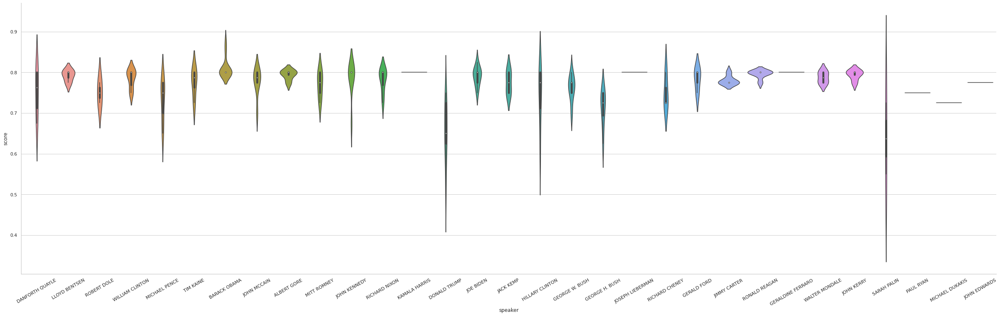

In [ ]:
# violin plots of each speakers vs score
df = SS_SSO_grouped_candidates_only_df.copy()

sns.set(style="whitegrid")
fig = sns.catplot(x="speaker", y="score", kind="violin", data=df, height=10, aspect=2)
# fig = sns.catplot(x="speaker", y="speaker_num_entries_in_dataset", kind="violin", data=df, height=10, aspect=2)
fig.fig.set_size_inches(35, 10)
fig.set_xticklabels(rotation=30)

/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/feature_selection/_univariate_selection.py:289: RuntimeWarning: invalid value encountered in true_divide
  correlation_coefficient /= X_norms
/home/david/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, 

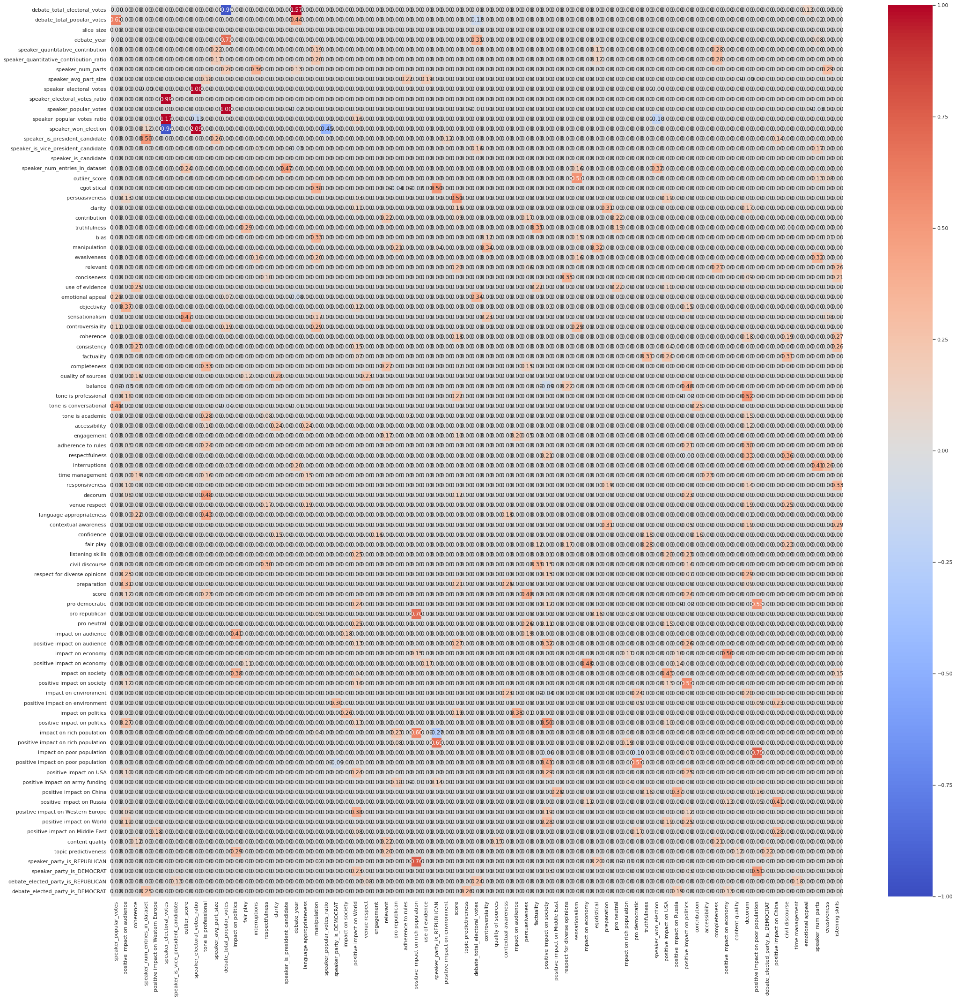

In [ ]:
df = SS_SSO_grouped_candidates_only_df

# remove all strings from df
df = df[[v for v in df.keys() if not isinstance(df[v].iloc[0], str)]]

# create a heatmap of the activation functions with the left side being the input and the right side being the output
formulas = {}
for k in df.keys():
    # remove all others in a group when v is in group slice_speaker_observables_correlated_by_design
    blacklist = [k]
    for v in slice_speaker_variables_correlated_by_design:
        if k in v:
            blacklist.extend(v)
    blacklist = list(set(blacklist))
    
    # X = df[[v for v in df.keys() if v != k]]
    X = df[[v for v in df.keys() if v not in blacklist]]
    y = df[k]
    # copy them
    X = X.copy()
    y = y.copy()
    # normalize
    for v in X.keys():
        if X[v].std() != 0:
            X[v] = (X[v] - X[v].mean()) / X[v].std()
        else:
            X[v] = X[v] - X[v].mean()

    if y.std() != 0:
        y = (y - y.mean()) / y.std()
    else:
        y = y - y.mean()

    m = LinearRegression()
    m.fit(X, y)

    m2 = Ridge(alpha=0.5)
    m2.fit(X, y)

    # regression that only keeps max 4 features
    m3 = ElasticNet(alpha=0.5, l1_ratio=0.5)
    m3.fit(X, y)

    X_slected = SelectKBest(r_regression, k=4).fit_transform(X, y)
    selected_features = SelectKBest(r_regression, k=4).fit(X, y).get_support()
    selected_features = [v for i, v in enumerate(X.keys()) if selected_features[i]]
    m4 = LinearRegression()
    m4.fit(X_slected, y)

    formulas[k] = {
        # 'LinearRegression R^2': m.score(X, y),
        # f'Ridge (alpha={m2.alpha}) R^2': m2.score(X, y),
        # f'ElasticNet (alpha={m3.alpha}, l1_ratio={m3.l1_ratio}) R^2': m3.score(X, y),
        # f'LinearRegression (only 4 features) R^2': m4.score(X_slected, y),
    }

    # add activations of m4 weights
    for i, coef in enumerate(m4.coef_):
        if abs(coef) > 1e-10:
            formulas[k][selected_features[i]] = coef

    # print(f'{k} vs all')
    # print(f'\tR^2: {m.score(X, y):.3f}')
    # features = []
    # for i, coef in enumerate(m.coef_):
    #     if abs(coef) > 1e-10:
    #         features.append((coef, X.keys()[i]))
    # features = sorted(features, key=lambda x: abs(x[0]), reverse=True)[:6]
    # print(' + '.join([f'{coef:.3f} * {feature}' for coef, feature in features]))
    # # print(f'\tcoef: {m.coef_}')
    # print(f'\tR^2: {m2.score(X, y):.3f}')
    # # print(f'\tcoef: {m2.coef_}')
    # print(f'\tR^2: {m3.score(X, y):.3f}')
    # # print the names of the non zero coefficients as a formula
    # print(f'\tR^2: {m4.score(X_slected, y):.3f}')
    # print('\tFromula:\t', end='')
    # features = []
    # for i, coef in enumerate(m4.coef_):
    #     if abs(coef) > 1e-10:
    #         features.append((coef, selected_features[i]))
    # features = sorted(features, key=lambda x: abs(x[0]), reverse=True)
    # print(' + '.join([f'{coef:.3f} * {feature}' for coef, feature in features]))
    # print()

# create a heatmap of the activation functions with the left side being the input and the right side being the output
columns = list(set([k for v in formulas.values() for k in v.keys()]))
rows = list(formulas.keys())

data = np.zeros((len(rows), len(columns)))
for i, row in enumerate(rows):
    for j, column in enumerate(columns):
        if column in formulas[row]:
            data[i, j] = formulas[row][column]
        else:
            data[i, j] = 0

f, ax = plt.subplots(figsize=(35, 35))
# coolwarm
cmap = sns.color_palette("coolwarm", as_cmap=True)
sns.heatmap(data, xticklabels=columns, yticklabels=rows, annot=True, fmt='.2f', cmap=cmap, ax=ax, vmin=-1, vmax=1)
# rotate the xticks
plt.xticks(rotation=90)
# xticks not showing up
plt.show()